# Game Indexing v1 - Local Version

This notebook has been converted from Colab to run locally.

## Prerequisites
- NVIDIA GPU with CUDA support
- Python 3.10+
- ffmpeg installed on system (`sudo apt install ffmpeg` or `brew install ffmpeg`)


## Cell 1: Environment Variables

In [ ]:
import os
from dotenv import load_dotenv

# Load environment variables from .env file
load_dotenv()

# Verify that API keys are loaded
if not os.getenv("HF_TOKEN"):
    raise ValueError("HF_TOKEN not found in environment. Please check your .env file.")
if not os.getenv("ROBOFLOW_API_KEY"):
    raise ValueError("ROBOFLOW_API_KEY not found in environment. Please check your .env file.")

## Cell 3: Set HOME Directory

In [3]:
from pathlib import Path

HOME = Path.cwd()
print("HOME:", HOME)

HOME: /Users/pranav/Documents/git/luka-magic


## Cell 4: Clone and Install segment-anything-2-real-time

In [4]:
import subprocess
import sys

# For Apple Silicon Macs, we use the official SAM2 package instead of the CUDA-dependent fork
print("Installing SAM2 package for Apple Silicon...")

# Install the official sam2 package
subprocess.run(
    [sys.executable, "-m", "pip", "install", "sam2", "-q"],
    check=True
)

# Download the checkpoint if it doesn't exist
CHECKPOINTS_DIR = HOME / "checkpoints"
CHECKPOINTS_DIR.mkdir(parents=True, exist_ok=True)

SAM2_CHECKPOINT = CHECKPOINTS_DIR / "sam2.1_hiera_large.pt"

if not SAM2_CHECKPOINT.exists():
    print("Downloading SAM2 checkpoint...")
    
    # Use requests library (handles SSL better than urllib)
    try:
        import requests
    except ImportError:
        subprocess.run([sys.executable, "-m", "pip", "install", "requests", "-q"], check=True)
        import requests
    
    url = "https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt"
    response = requests.get(url, stream=True)
    response.raise_for_status()
    
    total_size = int(response.headers.get('content-length', 0))
    
    with open(SAM2_CHECKPOINT, 'wb') as f:
        downloaded = 0
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)
            downloaded += len(chunk)
            if total_size:
                percent = (downloaded / total_size) * 100
                print(f"\rDownloading: {percent:.1f}%", end="", flush=True)
    
    print(f"\nCheckpoint downloaded to: {SAM2_CHECKPOINT}")
else:
    print(f"Checkpoint already exists at: {SAM2_CHECKPOINT}")

print("SAM2 setup complete!")

Installing SAM2 package for Apple Silicon...
Checkpoint already exists at: /Users/pranav/Documents/git/luka-magic/checkpoints/sam2.1_hiera_large.pt
SAM2 setup complete!


## Cell 5: Download SAM2 Checkpoints

In [5]:
# Download the checkpoint if it doesn't exist
CHECKPOINTS_DIR = HOME / "checkpoints"
CHECKPOINTS_DIR.mkdir(parents=True, exist_ok=True)

SAM2_CHECKPOINT = CHECKPOINTS_DIR / "sam2.1_hiera_large.pt"

if SAM2_CHECKPOINT.exists():
    print(f"Checkpoint already exists at: {SAM2_CHECKPOINT}")
else:
    print("Downloading SAM2 checkpoint...")
    
    # Use requests library (handles SSL better than urllib)
    try:
        import requests
    except ImportError:
        subprocess.run([sys.executable, "-m", "pip", "install", "requests", "-q"], check=True)
        import requests
    
    url = "https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt"
    response = requests.get(url, stream=True)
    response.raise_for_status()
    
    total_size = int(response.headers.get('content-length', 0))
    
    with open(SAM2_CHECKPOINT, 'wb') as f:
        downloaded = 0
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)
            downloaded += len(chunk)
            if total_size:
                percent = (downloaded / total_size) * 100
                print(f"\rDownloading: {percent:.1f}%", end="", flush=True)
    
    print(f"\nCheckpoint downloaded to: {SAM2_CHECKPOINT}")

print("SAM2 checkpoint ready!")

Checkpoint already exists at: /Users/pranav/Documents/git/luka-magic/checkpoints/sam2.1_hiera_large.pt
SAM2 checkpoint ready!


## Cell 6: Install Dependencies

In [ ]:
import subprocess
import sys

packages = [
    "gdown",
    "inference-gpu",  # Use 'inference' if no GPU
    "supervision==0.27.0",
    "git+https://github.com/roboflow/sports.git@feat/basketball",
    "transformers",
    "num2words",
    "sam2",
    "python-dotenv"
]

print("Installing dependencies...")
for pkg in packages:
    print(f"  Installing {pkg}...")
    subprocess.run(
        [sys.executable, "-m", "pip", "install", "-q", pkg],
        check=False
    )
print("Done installing dependencies.")

Installing dependencies...
  Installing gdown...
  Installing inference-gpu...


ERROR: Cannot install inference-gpu==0.29.2, inference-gpu==0.30.0, inference-gpu==0.31.0, inference-gpu==0.31.1, inference-gpu==0.32.0, inference-gpu==0.33.0, inference-gpu==0.34.0, inference-gpu==0.35.0, inference-gpu==0.36.0, inference-gpu==0.36.1, inference-gpu==0.37.1, inference-gpu==0.38.0, inference-gpu==0.39.0, inference-gpu==0.40.0, inference-gpu==0.41.0, inference-gpu==0.42.1, inference-gpu==0.43.0, inference-gpu==0.44.0, inference-gpu==0.44.1, inference-gpu==0.45.0, inference-gpu==0.45.1, inference-gpu==0.45.2, inference-gpu==0.45.3, inference-gpu==0.46.0, inference-gpu==0.46.1, inference-gpu==0.46.3, inference-gpu==0.46.4, inference-gpu==0.46.5, inference-gpu==0.47.0, inference-gpu==0.48.0, inference-gpu==0.48.1, inference-gpu==0.48.3, inference-gpu==0.49.1, inference-gpu==0.49.2, inference-gpu==0.49.3, inference-gpu==0.49.5, inference-gpu==0.50.0, inference-gpu==0.50.1, inference-gpu==0.50.2, inference-gpu==0.50.3, inference-gpu==0.50.4, inference-gpu==0.50.5, inference-gp

  Installing supervision==0.27.0...
  Installing git+https://github.com/roboflow/sports.git@feat/basketball...
  Installing transformers...
  Installing num2words...
  Installing sam2...
Done installing dependencies.


## Cell 7: Configure ONNX Runtime

In [7]:
import os

os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]" 

## Cells 8 & 9: Download Source Videos

In [8]:
import gdown

SOURCE_VIDEO_DIRECTORY = HOME / "source"
SOURCE_VIDEO_DIRECTORY.mkdir(parents=True, exist_ok=True)

# Download single video (as configured in the original notebook)
FILE_ID = "1BZqbRMN1VkBfNJjWpIIhKoGLTII5KlBn"
VIDEO_FILENAME = "user_provided_single_video.mp4"
SOURCE_VIDEO_PATH = SOURCE_VIDEO_DIRECTORY / VIDEO_FILENAME

if not SOURCE_VIDEO_PATH.exists():
    print(f"Downloading video to {SOURCE_VIDEO_PATH}...")
    gdown.download(id=FILE_ID, output=str(SOURCE_VIDEO_PATH), quiet=False)
else:
    print(f"Video already exists at {SOURCE_VIDEO_PATH}")

print(f"\nDownloaded video to: {SOURCE_VIDEO_PATH}")
print("\nContents of source directory:")
for f in SOURCE_VIDEO_DIRECTORY.iterdir():
    print(f"  {f.name}")

Video already exists at /Users/pranav/Documents/git/luka-magic/source/user_provided_single_video.mp4

Downloaded video to: /Users/pranav/Documents/git/luka-magic/source/user_provided_single_video.mp4

Contents of source directory:
  user_provided_single_video.mp4


## Cell 11: Team Rosters and Colors

In [33]:
TEAM_ROSTERS = {
    "New York Knicks": {
        "55": "Hukporti",
        "1": "Payne",
        "0": "Wright",
        "11": "Brunson",
        "3": "Hart",
        "32": "Towns",
        "44": "Shamet",
        "25": "Bridges",
        "2": "McBride",
        "23": "Robinson",
        "8": "Anunoby",
        "4": "Dadiet",
        "5": "Achiuwa",
        "13": "Kolek"
    },
    "Detroit Pistons": {
        "1": "Cunningham",
        "5": "Holland",
        "8": "LeVert",
        "9": "Moore Jr",
        "12": "Harris",
        "13": "Reed Jr",
        "14": "Green",
        "15": "Smith",
        "20": "Lanier",
        "23": "Ivey",
        "24": "Jenkins",
        "34": "Klintman",
    }
}

TEAM_COLORS = {
    "New York Knicks": "#006BB6",
    "Detroit Pistons": "#FFFFFF"
}

In [10]:
import subprocess
import sys

# Install missing packages
packages = [
    "inference",  # Use 'inference' instead of 'inference-gpu' for Mac (no CUDA)
    "ipywidgets",  # Fixes the tqdm warning
]

for pkg in packages:
    print(f"Installing {pkg}...")
    subprocess.run([sys.executable, "-m", "pip", "install", pkg, "-q"], check=True)

print("Done!")


Installing inference...
Installing ipywidgets...
Done!


## Cell 12: Imports

In [11]:
from typing import Dict, List, Optional, Union, Iterable, Tuple
from operator import itemgetter

import cv2
import numpy as np
import torch
from tqdm import tqdm

import supervision as sv
from inference import get_model
from sports import (
    clean_paths,
    ConsecutiveValueTracker,
    TeamClassifier,
    MeasurementUnit,
    ViewTransformer
)
from sports.basketball import (
    CourtConfiguration,
    League,
    draw_court,
    draw_points_on_court,
    draw_paths_on_court,
    draw_made_and_miss_on_court,
    ShotEventTracker
)

ModelDependencyMissing: Your `inference` configuration does not support Qwen2.5-VL model. Use pip install 'inference[transformers]' to install missing requirements.To suppress this warning, set QWEN_2_5_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support SAM model. Use pip install 'inference[sam]' to install missing requirements.To suppress this warning, set CORE_MODEL_SAM_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support SAM3 model. Install SAM3 dependencies and set CORE_MODEL_SAM3_ENABLED to True.
ModelDependencyMissing: Your `inference` configuration does not support Gaze Detection model. Use pip install 'inference[gaze]' to install missing requirements.To suppress this warning, set CORE_MODEL_GAZE_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support YoloWorld model. Use pip install 'inference[yolo-world]' to install missing requirements.To suppress this warning, set CO

## Cell 13: Load Player Detection Model

In [12]:
PLAYER_DETECTION_MODEL_ID = "basketball-player-detection-3-ycjdo/5"
PLAYER_DETECTION_MODEL_CONFIDENCE = 0.4
PLAYER_DETECTION_MODEL_IOU_THRESHOLD = 0.9
PLAYER_DETECTION_MODEL = get_model(
    model_id=PLAYER_DETECTION_MODEL_ID,
    api_key=os.environ["ROBOFLOW_API_KEY"]
)

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])

Resolved model_id: basketball-player-detection-3-ycjdo/5, dataset_id: basketball-player-detection-3-ycjdo, version_id: 5


## Cell 14: Test Detection on Single Frame

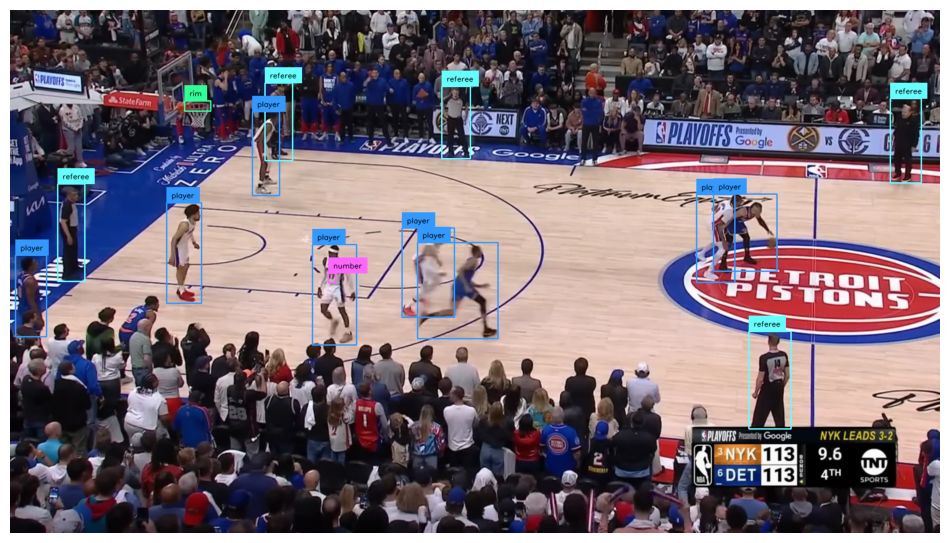

In [13]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(str(SOURCE_VIDEO_PATH))
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(
    frame,
    confidence=PLAYER_DETECTION_MODEL_CONFIDENCE,
    iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD
)[0]
detections = sv.Detections.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections)

sv.plot_image(annotated_frame)

## Cell 15: Test Number Detection

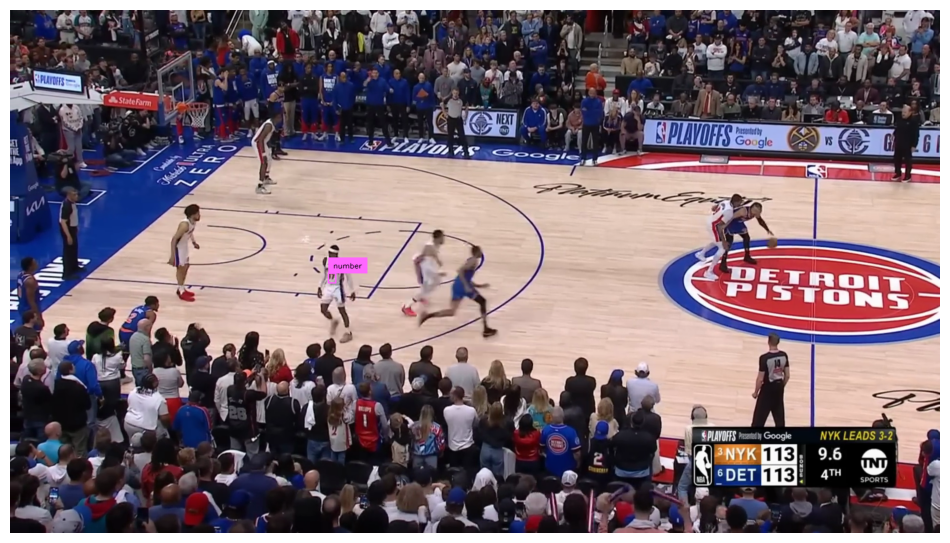

In [14]:
NUMBER_CLASS_ID = 2

box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(str(SOURCE_VIDEO_PATH))
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(
    frame,
    confidence=PLAYER_DETECTION_MODEL_CONFIDENCE,
    iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD
)[0]
detections = sv.Detections.from_inference(result)
detections = detections[detections.class_id == NUMBER_CLASS_ID]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections)

sv.plot_image(annotated_frame)

## Cell 16: Test Player Detection (Specific Classes)

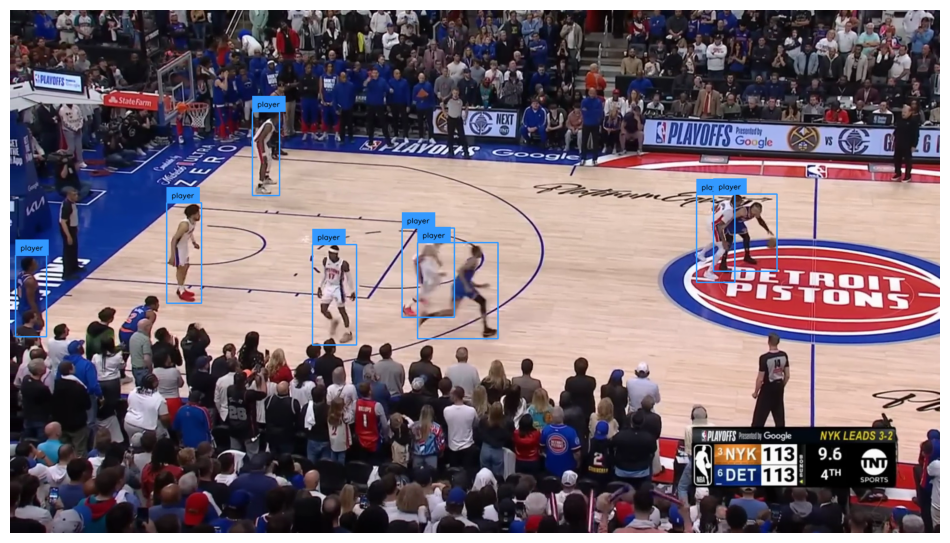

In [15]:
PLAYER_CLASS_IDS = [3, 4, 5, 6, 7]  # player, player-in-possession, player-jump-shot, player-layup-dunk, player-shot-block

box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(str(SOURCE_VIDEO_PATH))
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(
    frame,
    confidence=PLAYER_DETECTION_MODEL_CONFIDENCE,
    iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD
)[0]
detections = sv.Detections.from_inference(result)
detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections)

sv.plot_image(annotated_frame)

## Cell 17: Process Full Video with Detection

In [16]:
TARGET_VIDEO_PATH = HOME / f"{SOURCE_VIDEO_PATH.stem}-detection{SOURCE_VIDEO_PATH.suffix}"
TARGET_VIDEO_COMPRESSED_PATH = HOME / f"{TARGET_VIDEO_PATH.stem}-compressed{TARGET_VIDEO_PATH.suffix}"

box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

def callback(frame: np.ndarray, index: int) -> np.ndarray:
    result = PLAYER_DETECTION_MODEL.infer(
        frame,
        confidence=PLAYER_DETECTION_MODEL_CONFIDENCE,
        iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD
    )[0]
    detections = sv.Detections.from_inference(result)

    annotated_frame = frame.copy()
    annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
    annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections)
    return annotated_frame

sv.process_video(
    source_path=str(SOURCE_VIDEO_PATH),
    target_path=str(TARGET_VIDEO_PATH),
    callback=callback,
    show_progress=True
)

# Compress with ffmpeg
subprocess.run([
    "ffmpeg", "-y", "-loglevel", "error",
    "-i", str(TARGET_VIDEO_PATH),
    "-vcodec", "libx264", "-crf", "28",
    str(TARGET_VIDEO_COMPRESSED_PATH)
], check=True)

print(f"Detection video saved to: {TARGET_VIDEO_COMPRESSED_PATH}")

Processing video:   0%|          | 0/287 [00:00<?, ?it/s]

Detection video saved to: /Users/pranav/Documents/git/luka-magic/user_provided_single_video-detection-compressed.mp4


In [17]:
from IPython.display import Video
Video(str(TARGET_VIDEO_COMPRESSED_PATH), embed=True, width=720)

## Cell 18: Load SAM2 Model

In [18]:
from sam2 import build_sam
print(dir(build_sam))

['HF_MODEL_ID_TO_FILENAMES', 'OmegaConf', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', '_hf_download', '_load_checkpoint', 'build_sam2', 'build_sam2_hf', 'build_sam2_video_predictor', 'build_sam2_video_predictor_hf', 'compose', 'instantiate', 'logging', 'os', 'sam2', 'torch']


In [19]:
import torch
from sam2.build_sam import build_sam2_video_predictor_hf

# Use MPS (Metal Performance Shaders) for Apple Silicon
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Using Apple Silicon GPU (MPS)")
elif torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using NVIDIA GPU (CUDA)")
else:
    device = torch.device("cpu")
    print("Using CPU (this will be slow)")

print("Loading SAM2 model from HuggingFace...")
predictor = build_sam2_video_predictor_hf(
    model_id="facebook/sam2.1-hiera-large",
    device=device
)
print("SAM2 model loaded.")

Using Apple Silicon GPU (MPS)
Loading SAM2 model from HuggingFace...
SAM2 model loaded.


## Cell 19: SAM2Tracker Class

In [20]:
from __future__ import annotations
import tempfile
import shutil

class SAM2Tracker:
    def __init__(self, predictor, source_video_path, device="mps") -> None:
        self.predictor = predictor
        self.device = device
        self.source_video_path = source_video_path
        self._prompted = False
        self._video_segments = {}
        self._frame_idx = -1
        self._frames_dir = None

    def prompt_first_frame(self, frame: np.ndarray, detections: sv.Detections) -> None:
        if len(detections) == 0:
            raise ValueError("detections must contain at least one box")

        if detections.tracker_id is None:
            detections.tracker_id = list(range(1, len(detections) + 1))

        # Extract all frames to a temp directory as JPEGs
        print("Extracting video frames...")
        self._frames_dir = tempfile.mkdtemp()
        
        frame_generator = sv.get_video_frames_generator(str(self.source_video_path))
        for i, f in enumerate(frame_generator):
            frame_path = os.path.join(self._frames_dir, f"{i:05d}.jpg")
            cv2.imwrite(frame_path, f)
        
        print(f"Extracted {i + 1} frames to temp directory")

        # Initialize inference state with the frames directory
        self._inference_state = self.predictor.init_state(video_path=self._frames_dir)

        # Add prompts for each detection on frame 0
        for xyxy, obj_id in zip(detections.xyxy, detections.tracker_id):
            _, _, _ = self.predictor.add_new_points_or_box(
                inference_state=self._inference_state,
                frame_idx=0,
                obj_id=int(obj_id),
                box=xyxy,
            )

        # Propagate through entire video at once
        print("Propagating masks through video (this may take a while)...")
        for out_frame_idx, out_obj_ids, out_mask_logits in self.predictor.propagate_in_video(self._inference_state):
            self._video_segments[out_frame_idx] = {
                out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy().squeeze()
                for i, out_obj_id in enumerate(out_obj_ids)
            }
        print(f"Processed {len(self._video_segments)} frames")

        self._prompted = True
        self._frame_idx = -1

    def propagate(self, frame: np.ndarray) -> sv.Detections:
        if not self._prompted:
            raise RuntimeError("Call prompt_first_frame before propagate")

        self._frame_idx += 1

        if self._frame_idx not in self._video_segments:
            return sv.Detections.empty()

        masks_dict = self._video_segments[self._frame_idx]
        
        if not masks_dict:
            return sv.Detections.empty()

        tracker_ids = np.array(list(masks_dict.keys()), dtype=np.int32)
        masks = np.array([masks_dict[tid] for tid in tracker_ids])
        
        masks = masks.astype(bool)

        if masks.ndim == 2:
            masks = masks[None, ...]

        masks = np.array([
            sv.filter_segments_by_distance(mask, relative_distance=0.03, mode="edge")
            for mask in masks
        ])

        xyxy = sv.mask_to_xyxy(masks=masks)
        detections = sv.Detections(xyxy=xyxy, mask=masks, tracker_id=tracker_ids)
        return detections

    def reset(self) -> None:
        self._prompted = False
        self._video_segments = {}
        self._inference_state = None
        if self._frames_dir and os.path.exists(self._frames_dir):
            shutil.rmtree(self._frames_dir)
        self._frames_dir = None

## Cell 20: Process Video with SAM2 Segmentation

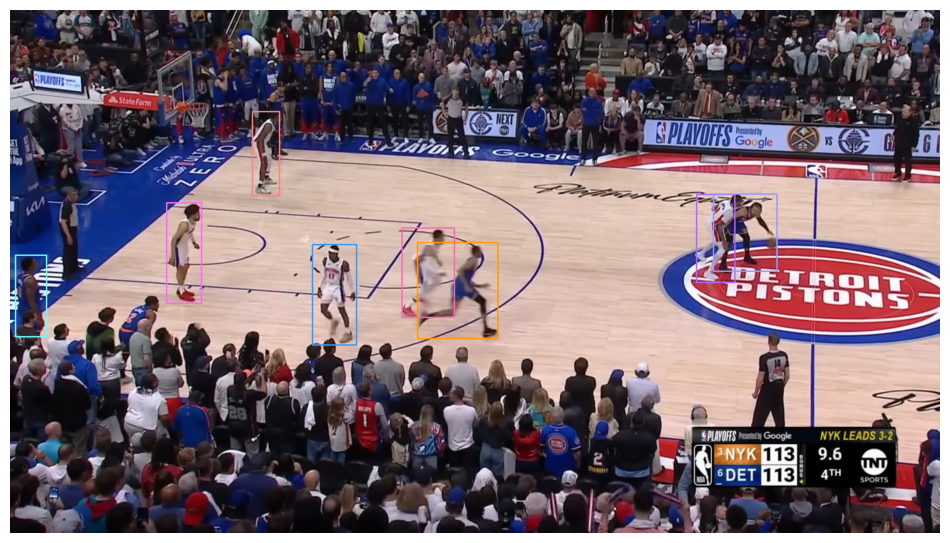

Extracting video frames...
Extracted 206 frames to temp directory


frame loading (JPEG): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 206/206 [00:06<00:00, 33.03it/s]


Propagating masks through video (this may take a while)...


propagate in video: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 206/206 [54:43<00:00, 15.94s/it]


Processed 206 frames


Processing video:   0%|          | 0/287 [00:00<?, ?it/s]

Python(24030) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Segmentation video saved to: /Users/pranav/Documents/git/luka-magic/user_provided_single_video-mask-compressed.mp4


In [22]:
TARGET_VIDEO_PATH = HOME / f"{SOURCE_VIDEO_PATH.stem}-mask{SOURCE_VIDEO_PATH.suffix}"
TARGET_VIDEO_COMPRESSED_PATH = HOME / f"{TARGET_VIDEO_PATH.stem}-compressed{TARGET_VIDEO_PATH.suffix}"

# Define annotators
mask_annotator = sv.MaskAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    opacity=0.5
)
box_annotator = sv.BoxAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    thickness=2
)

# Get first frame and run detection
frame_generator = sv.get_video_frames_generator(str(SOURCE_VIDEO_PATH))
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(
    frame,
    confidence=PLAYER_DETECTION_MODEL_CONFIDENCE,
    iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD
)[0]
detections = sv.Detections.from_inference(result)
detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]
detections.tracker_id = np.arange(1, len(detections.class_id) + 1)

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
sv.plot_image(annotated_frame)

# Initialize SAM2 tracker with the source video path
tracker = SAM2Tracker(predictor, SOURCE_VIDEO_PATH, device=device)
tracker.prompt_first_frame(frame, detections)

# Process video - masks are already computed, this just applies them
def callback(frame: np.ndarray, index: int) -> np.ndarray:
    detections = tracker.propagate(frame)
    annotated_frame = frame.copy()
    annotated_frame = mask_annotator.annotate(scene=annotated_frame, detections=detections)
    annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
    return annotated_frame

sv.process_video(
    source_path=str(SOURCE_VIDEO_PATH),
    target_path=str(TARGET_VIDEO_PATH),
    callback=callback,
    show_progress=True
)

# Clean up
tracker.reset()

# Compress with ffmpeg (optional)
subprocess.run([
    "ffmpeg", "-y", "-loglevel", "error",
    "-i", str(TARGET_VIDEO_PATH),
    "-vcodec", "libx264", "-crf", "28",
    str(TARGET_VIDEO_COMPRESSED_PATH)
], check=True)

print(f"Segmentation video saved to: {TARGET_VIDEO_COMPRESSED_PATH}")

## Cell 21: Display Segmentation Video

In [23]:
from IPython.display import Video
Video(str(TARGET_VIDEO_COMPRESSED_PATH), embed=True, width=720)

In [24]:
STRIDE = 30

crops = []

for video_path in sv.list_files_with_extensions(SOURCE_VIDEO_DIRECTORY, extensions=["mp4", "avi", "mov"]):
    frame_generator = sv.get_video_frames_generator(source_path=video_path, stride=STRIDE)

    for frame in tqdm(frame_generator):

        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD, class_agnostic_nms=True)[0]
        detections = sv.Detections.from_inference(result)
        detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]

        boxes = sv.scale_boxes(xyxy=detections.xyxy, factor=0.4)
        for box in boxes:
            crops.append(sv.crop_image(frame, box))

7it [00:03,  2.10it/s]


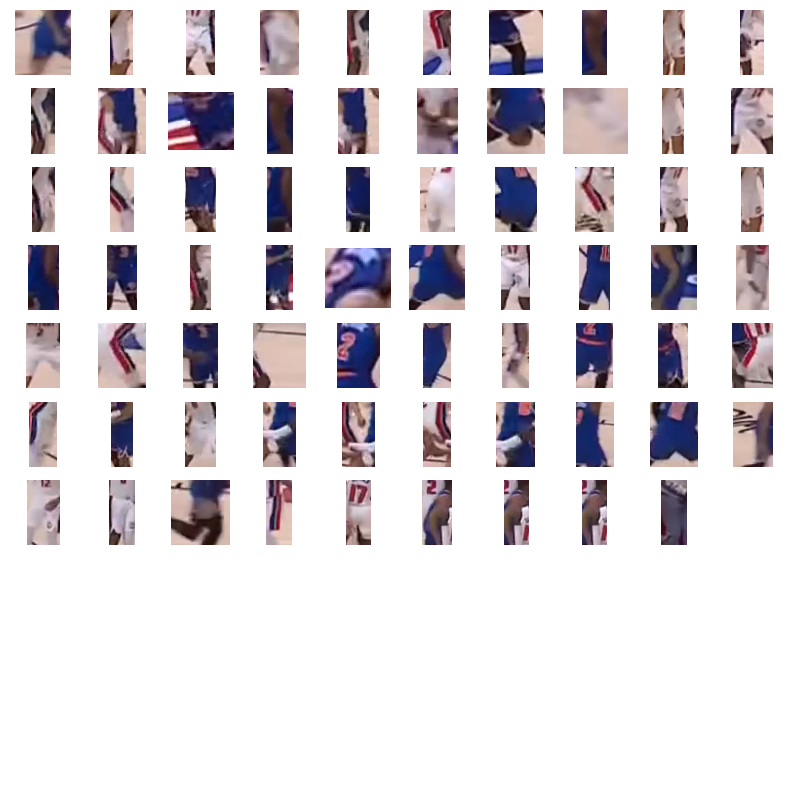

In [25]:
sv.plot_images_grid(
    images=crops[:100],
    grid_size=(10, 10),
    size=(10, 10)
)

In [26]:
team_classifier = TeamClassifier(device="mps")
team_classifier.fit(crops)

config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/813M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Embedding extraction: 3it [00:03,  1.22s/it]
Python(58165) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Embedding extraction: 3it [00:02,  1.03it/s]


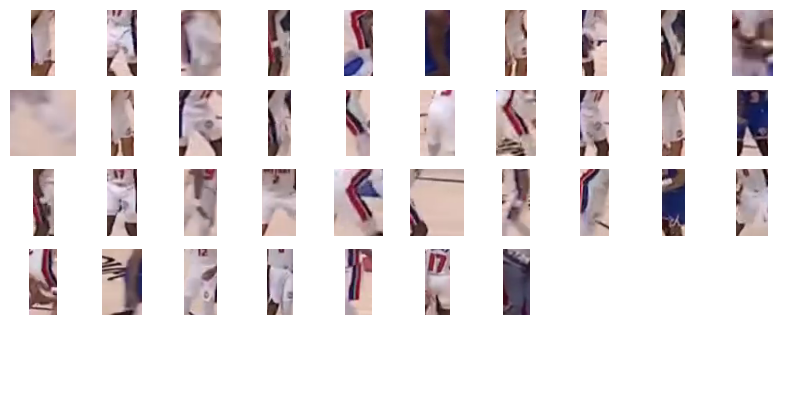

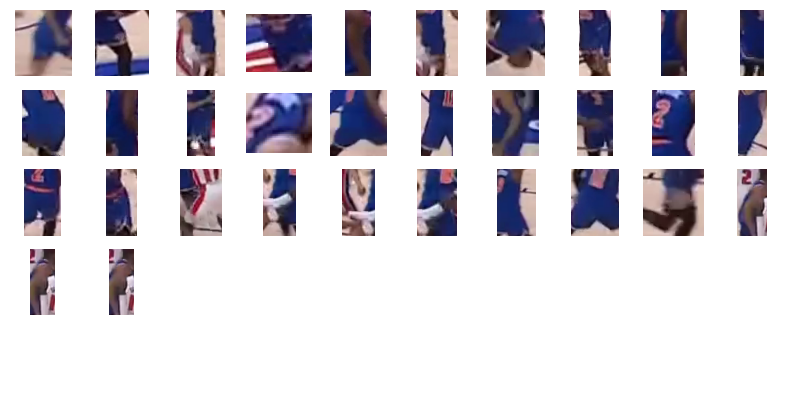

In [27]:
teams = team_classifier.predict(crops)

team_0 = [crop for crop, team in zip(crops, teams) if team == 0]
team_1 = [crop for crop, team in zip(crops, teams) if team == 1]

sv.plot_images_grid(
    images=team_0[:50],
    grid_size=(5, 10),
    size=(10, 5)
)

sv.plot_images_grid(
    images=team_1[:50],
    grid_size=(5, 10),
    size=(10, 5)
)

Embedding extraction: 1it [00:14, 14.71s/it]


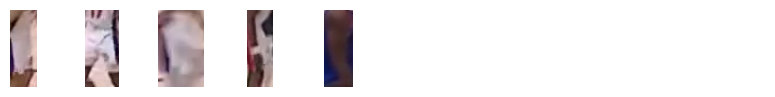

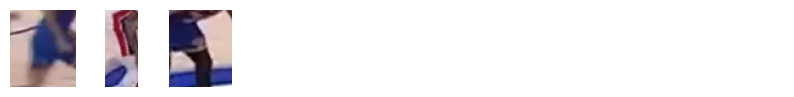

In [28]:
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD, class_agnostic_nms=True)[0]
detections = sv.Detections.from_inference(result)
detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]

boxes = sv.scale_boxes(xyxy=detections.xyxy, factor=0.4)
crops = [sv.crop_image(frame, box) for box in boxes]
teams = np.array(team_classifier.predict(crops))

team_0 = [crop for crop, team in zip(crops, teams) if team == 0]
team_1 = [crop for crop, team in zip(crops, teams) if team == 1]

sv.plot_images_grid(
    images=team_0[:10],
    grid_size=(1, 10),
    size=(10, 1)
)

sv.plot_images_grid(
    images=team_1[:10],
    grid_size=(1, 10),
    size=(10, 1)
)

In [29]:
TEAM_NAMES = {
    0: "New York Knicks",
    1: "Detroit Pistons",
}
# potential problem here! teams cannot be auto assigned by K-means clustering (since its just splitting it into two portions..)

In [34]:
TARGET_VIDEO_PATH = HOME / f"{SOURCE_VIDEO_PATH.stem}-teams{SOURCE_VIDEO_PATH.suffix}"
TARGET_VIDEO_COMPRESSED_PATH = HOME / f"{TARGET_VIDEO_PATH.stem}-compressed{TARGET_VIDEO_PATH.suffix}"

frame_generator = sv.get_video_frames_generator(str(SOURCE_VIDEO_PATH))  # Add str()
frame = next(frame_generator)

# define team annotators

team_colors = sv.ColorPalette.from_hex([
    TEAM_COLORS[TEAM_NAMES[0]],
    TEAM_COLORS[TEAM_NAMES[1]]
])

team_mask_annotator = sv.MaskAnnotator(
    color=team_colors,
    opacity=0.5,
    color_lookup=sv.ColorLookup.INDEX
)

team_box_annotator = sv.BoxAnnotator(
    color=team_colors,
    thickness=2,
    color_lookup=sv.ColorLookup.INDEX
)

# we use RF-DETR model to aquire future SAM2 prompt

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]
detections.tracker_id = np.arange(1, len(detections.class_id) + 1)

# we determine the team for each player and assign a team ID to every detection

boxes = sv.scale_boxes(xyxy=detections.xyxy, factor=0.4)
crops = [sv.crop_image(frame, box) for box in boxes]
TEAMS = np.array(team_classifier.predict(crops))

# we prompt SAM2 using RF-DETR model detections

tracker = SAM2Tracker(predictor, SOURCE_VIDEO_PATH, device=device)  # Add SOURCE_VIDEO_PATH and device
tracker.prompt_first_frame(frame, detections)

# we propagate tacks across all video frames

def callback(frame: np.ndarray, index: int) -> np.ndarray:
    detections = tracker.propagate(frame)
    annotated_frame = frame.copy()
    annotated_frame = team_mask_annotator.annotate(
        scene=annotated_frame,
        detections=detections,
        custom_color_lookup=TEAMS[detections.tracker_id - 1]
    )
    annotated_frame = team_box_annotator.annotate(
        scene=annotated_frame,
        detections=detections,
        custom_color_lookup=TEAMS[detections.tracker_id - 1]
    )
    return annotated_frame

sv.process_video(
    source_path=str(SOURCE_VIDEO_PATH),  # Add str()
    target_path=str(TARGET_VIDEO_PATH),  # Add str()
    callback=callback,
    show_progress=True
)

!ffmpeg -y -loglevel error -i {TARGET_VIDEO_PATH} -vcodec libx264 -crf 28 {TARGET_VIDEO_COMPRESSED_PATH}

Embedding extraction: 1it [00:12, 12.60s/it]


Extracting video frames...
Extracted 206 frames to temp directory


frame loading (JPEG): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 206/206 [00:06<00:00, 32.67it/s]

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).


Propagating masks through video (this may take a while)...


propagate in video: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 206/206 [17:17<00:00,  5.04s/it]

Processed 206 frames


Processing video:   0%|          | 0/287 [00:00<?, ?it/s]

Python(91287) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [35]:
Video(TARGET_VIDEO_COMPRESSED_PATH, embed=True, width=720)